<a href="https://www.kaggle.com/code/abushayid/br35h-brain-tumor-classification-ensemble?scriptVersionId=207622865" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import cv2
import os
import tensorflow as tf
from tensorflow import keras
from PIL import Image
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from keras.utils import normalize
from keras.models import Model, Sequential
from keras.layers import Conv2D, BatchNormalization, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Activation, Dropout, Flatten, Dense, ZeroPadding2D
from keras.utils import to_categorical

D1115 17:12:39.099846031      15 config.cc:119]                        gRPC EXPERIMENT tcp_frame_size_tuning               OFF (default:OFF)
D1115 17:12:39.099868357      15 config.cc:119]                        gRPC EXPERIMENT tcp_rcv_lowat                       OFF (default:OFF)
D1115 17:12:39.099871578      15 config.cc:119]                        gRPC EXPERIMENT peer_state_based_framing            OFF (default:OFF)
D1115 17:12:39.099873999      15 config.cc:119]                        gRPC EXPERIMENT flow_control_fixes                  ON  (default:ON)
D1115 17:12:39.099876504      15 config.cc:119]                        gRPC EXPERIMENT memory_pressure_controller          OFF (default:OFF)
D1115 17:12:39.099878960      15 config.cc:119]                        gRPC EXPERIMENT unconstrained_max_quota_buffer_size OFF (default:OFF)
D1115 17:12:39.099881304      15 config.cc:119]                        gRPC EXPERIMENT new_hpack_huffman_decoder           ON  (default:ON)
D1115 17:12:39.

In [2]:
no_tumor_images=os.listdir('../input/br35h-brain-tumor-dataset/Br35H_Brain_Tumor_Dataset/no')
yes_tumor_images=os.listdir('../input/br35h-brain-tumor-dataset/Br35H_Brain_Tumor_Dataset/yes')
#print(no_tumor_images)

X_train = []
Y_train = []
labels = ['no','yes']
image_size = 224

In [3]:
for i in labels:
    folderPath = os.path.join('../input/br35h-brain-tumor-dataset/Br35H_Brain_Tumor_Dataset',i)
    for j in os.listdir(folderPath):
        img = cv2.imread(os.path.join(folderPath,j))
        img = cv2.resize(img,(image_size,image_size))
        X_train.append(img)
        Y_train.append(i)

In [4]:
X_train = np.array(X_train)
Y_train = np.array(Y_train)

In [5]:
X_train,Y_train = shuffle(X_train,Y_train,random_state=101)
X_train.shape #shape is not a function thatswhy no parenthesis()

(3000, 224, 224, 3)

In [6]:
X_train, X_test, Y_train, Y_test=train_test_split(X_train, Y_train, test_size=0.2, random_state=0)

In [7]:
X_train=normalize(X_train, axis=1)
X_test=normalize(X_test, axis=1)

In [8]:
Y_train_new = [] # y_train_new and y_test_new are initialized as empty lists to store the encoded labels
for i in Y_train:
    Y_train_new.append(labels.index(i))
Y_train=Y_train_new
Y_train = tf.keras.utils.to_categorical(Y_train)

Y_test_new = []
for i in Y_test:
    Y_test_new.append(labels.index(i))
Y_test=Y_test_new
Y_test = tf.keras.utils.to_categorical(Y_test)

In [9]:
print("X_Train Shape:", X_train.shape)
print("X_Test Shape:", X_test.shape)
print("Y_Train Shape:", Y_train.shape)
print("Y_Test Shape:", Y_test.shape)

X_Train Shape: (2400, 224, 224, 3)
X_Test Shape: (600, 224, 224, 3)
Y_Train Shape: (2400, 2)
Y_Test Shape: (600, 2)


# Creating Base Learners Models for Ensemble Learning

## 1. CNN Model

In [10]:
model_cnn=Sequential()

model_cnn.add(Conv2D(32, (3,3), input_shape=(image_size, image_size, 3)))
model_cnn.add(Activation('relu'))
model_cnn.add(MaxPooling2D(pool_size=(2,2)))

model_cnn.add(Conv2D(32, (3,3), kernel_initializer='he_uniform'))
model_cnn.add(Activation('relu'))
model_cnn.add(MaxPooling2D(pool_size=(2,2)))


model_cnn.add(Conv2D(64, (3,3), kernel_initializer='he_uniform'))
model_cnn.add(Activation('relu'))
model_cnn.add(MaxPooling2D(pool_size=(2,2)))

model_cnn.add(Flatten())
model_cnn.add(Dense(128))
model_cnn.add(Activation('relu'))
model_cnn.add(Dropout(0.3))
model_cnn.add(Dense(64))
model_cnn.add(Activation('relu'))
model_cnn.add(Dropout(0.5))
model_cnn.add(Dense(2))
model_cnn.add(Activation('softmax'))

In [11]:
model_cnn.summary() 

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 activation (Activation)     (None, 222, 222, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      9248      
                                                                 
 activation_1 (Activation)   (None, 109, 109, 32)      0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                    

In [12]:
model_cnn.compile(loss='categorical_crossentropy',optimizer='Adam',metrics=['accuracy'])

In [13]:
history=model_cnn.fit(
    X_train, Y_train, 
    batch_size=16, 
    verbose=1, 
    epochs=13, 
    validation_data=(X_test, Y_test),
    shuffle=False
)

Epoch 1/13
150/150 [==============================] - 33s 213ms/step - loss: 0.5008 - accuracy: 0.7700 - val_loss: 0.3404 - val_accuracy: 0.8617
Epoch 2/13
150/150 [==============================] - 32s 211ms/step - loss: 0.2730 - accuracy: 0.8892 - val_loss: 0.1959 - val_accuracy: 0.9283
Epoch 3/13
150/150 [==============================] - 31s 204ms/step - loss: 0.1312 - accuracy: 0.9479 - val_loss: 0.1251 - val_accuracy: 0.9750
Epoch 4/13
150/150 [==============================] - 31s 208ms/step - loss: 0.0651 - accuracy: 0.9787 - val_loss: 0.1620 - val_accuracy: 0.9617
Epoch 5/13
150/150 [==============================] - 32s 210ms/step - loss: 0.0522 - accuracy: 0.9846 - val_loss: 0.1022 - val_accuracy: 0.9733
Epoch 6/13
150/150 [==============================] - 32s 212ms/step - loss: 0.0287 - accuracy: 0.9912 - val_loss: 0.1712 - val_accuracy: 0.9683
Epoch 7/13
150/150 [==============================] - 31s 208ms/step - loss: 0.0198 - accuracy: 0.9942 - val_loss: 0.1299 - val_ac

In [15]:
model_cnn.save('CNN_model.h5')

## 2. VGG16 Model

In [16]:
from tensorflow.keras.applications.vgg16 import VGG16



base_model_vgg16 = VGG16(
    weights = 'imagenet',
    include_top = False,
    input_shape = (image_size, image_size, 3)
)

base_model_vgg16.trainable = False

58889256/58889256 [==============================] - 0s 0us/step


In [17]:
base_model_vgg16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

### Adding layers to the top layers of VGG16

In [28]:
from tensorflow.keras import layers, models
from keras import regularizers


vgg16_modified = models.Sequential(
    [
    base_model_vgg16,
    layers.Flatten(),
    layers.Dense(512,activation='relu'),
    layers.Dense(256,activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(128,activation='relu',kernel_regularizer=regularizers.l2(0.01)),
    layers.Dense(2, activation = 'softmax')
    ]
)

In [29]:
vgg16_modified.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_3 (Flatten)         (None, 25088)             0         
                                                                 
 dense_13 (Dense)            (None, 512)               12845568  
                                                                 
 dense_14 (Dense)            (None, 256)               131328    
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_15 (Dense)            (None, 128)               32896     
                                                                 
 dense_16 (Dense)            (None, 2)                

In [30]:
vgg16_modified.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

In [32]:
history_vgg16_modified = vgg16_modified.fit(
    X_train, Y_train, 
    validation_data=(X_test, Y_test),
    batch_size=16,
    #validation_steps = 16,
    epochs= 12,
    verbose = 1
)

Epoch 1/12
150/150 [==============================] - 68s 453ms/step - loss: 1.1057 - accuracy: 0.7658 - val_loss: 0.8868 - val_accuracy: 0.7917
Epoch 2/12
150/150 [==============================] - 66s 444ms/step - loss: 0.6894 - accuracy: 0.8604 - val_loss: 0.5992 - val_accuracy: 0.8900
Epoch 3/12
150/150 [==============================] - 67s 444ms/step - loss: 0.4464 - accuracy: 0.9287 - val_loss: 0.4363 - val_accuracy: 0.9233
Epoch 4/12
150/150 [==============================] - 67s 448ms/step - loss: 0.3689 - accuracy: 0.9296 - val_loss: 0.3120 - val_accuracy: 0.9533
Epoch 5/12
150/150 [==============================] - 66s 439ms/step - loss: 0.2581 - accuracy: 0.9575 - val_loss: 0.2603 - val_accuracy: 0.9550
Epoch 6/12
150/150 [==============================] - 67s 445ms/step - loss: 0.2158 - accuracy: 0.9579 - val_loss: 0.3055 - val_accuracy: 0.9233
Epoch 7/12
150/150 [==============================] - 67s 450ms/step - loss: 0.1502 - accuracy: 0.9712 - val_loss: 0.1983 - val_ac

In [35]:
vgg16_modified.save('vgg16_modified.h5')

## 3. Inception3 Model

In [36]:
from keras.applications.inception_v3 import InceptionV3



base_model_inception_v3 = InceptionV3(
    weights = 'imagenet',
    include_top = False,
    input_shape = (image_size, image_size, 3)
)

base_model_inception_v3.trainable = False

### Adding layers at the top of InceptionV3 Model

In [37]:
model_inception_v3_modified = models.Sequential(
    [
    base_model_inception_v3,
    layers.Flatten(),
    layers.Dense(1024,activation='relu'),
    layers.Dense(512,activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(128,activation='relu',kernel_regularizer=regularizers.l2(0.01)),
    layers.Dense(2, activation = 'softmax')
    ]
)

In [38]:
model_inception_v3_modified.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_4 (Flatten)         (None, 51200)             0         
                                                                 
 dense_17 (Dense)            (None, 1024)              52429824  
                                                                 
 dense_18 (Dense)            (None, 512)               524800    
                                                                 
 dropout_6 (Dropout)         (None, 512)               0         
                                                                 
 dense_19 (Dense)            (None, 128)               65664     
                                                                 
 dense_20 (Dense)            (None, 2)                

In [39]:
model_inception_v3_modified.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

In [40]:
history_inception_v3_modified = model_inception_v3_modified.fit(
    X_train, Y_train, 
    validation_data=(X_test, Y_test),
    batch_size=16,
    #validation_steps = 16,
    epochs= 12,
    verbose = 1
)

Epoch 1/12
150/150 [==============================] - 71s 444ms/step - loss: 4.7745 - accuracy: 0.7729 - val_loss: 1.1835 - val_accuracy: 0.9333
Epoch 2/12
150/150 [==============================] - 67s 446ms/step - loss: 1.0719 - accuracy: 0.9467 - val_loss: 0.9802 - val_accuracy: 0.9583
Epoch 3/12
150/150 [==============================] - 65s 434ms/step - loss: 0.8574 - accuracy: 0.9717 - val_loss: 0.8182 - val_accuracy: 0.9683
Epoch 4/12
150/150 [==============================] - 65s 436ms/step - loss: 0.7858 - accuracy: 0.9596 - val_loss: 0.8542 - val_accuracy: 0.9433
Epoch 5/12
150/150 [==============================] - 65s 437ms/step - loss: 0.6305 - accuracy: 0.9892 - val_loss: 0.6798 - val_accuracy: 0.9733
Epoch 6/12
150/150 [==============================] - 65s 435ms/step - loss: 0.5400 - accuracy: 0.9933 - val_loss: 0.6480 - val_accuracy: 0.9700
Epoch 7/12
150/150 [==============================] - 66s 438ms/step - loss: 0.5124 - accuracy: 0.9858 - val_loss: 0.6901 - val_ac

In [41]:
model_inception_v3_modified.save('model_inception_v3_modified.h5')

In [42]:
from keras.applications.xception import Xception


base_model_Xception = Xception(
    weights = 'imagenet',
    include_top = False,
    input_shape = (image_size, image_size, 3)
)

base_model_Xception.trainable = False

83683744/83683744 [==============================] - 0s 0us/step


In [43]:
model_xception_modified = models.Sequential(
    [
    base_model_Xception,
    layers.Flatten(),
    layers.Dense(1024,activation='relu'),
    layers.Dense(512,activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(128,activation='relu',kernel_regularizer=regularizers.l2(0.01)),
    layers.Dense(2, activation = 'softmax')
    ]
)

In [44]:
model_xception_modified.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 flatten_5 (Flatten)         (None, 100352)            0         
                                                                 
 dense_21 (Dense)            (None, 1024)              102761472 
                                                                 
 dense_22 (Dense)            (None, 512)               524800    
                                                                 
 dropout_7 (Dropout)         (None, 512)               0         
                                                                 
 dense_23 (Dense)            (None, 128)               65664     
                                                                 
 dense_24 (Dense)            (None, 2)                

In [45]:
model_xception_modified.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

In [46]:
history_xception_modified = model_xception_modified.fit(
    X_train, Y_train, 
    validation_data=(X_test, Y_test),
    batch_size=16,
    #validation_steps = 16,
    epochs= 12,
    verbose = 1
)

Epoch 1/12
150/150 [==============================] - 123s 802ms/step - loss: 4.1168 - accuracy: 0.7500 - val_loss: 1.3305 - val_accuracy: 0.8300
Epoch 2/12
150/150 [==============================] - 120s 800ms/step - loss: 1.0632 - accuracy: 0.9304 - val_loss: 1.0135 - val_accuracy: 0.9133
Epoch 3/12
150/150 [==============================] - 120s 797ms/step - loss: 0.8434 - accuracy: 0.9554 - val_loss: 0.7560 - val_accuracy: 0.9683
Epoch 4/12
150/150 [==============================] - 121s 808ms/step - loss: 0.7008 - accuracy: 0.9758 - val_loss: 0.7046 - val_accuracy: 0.9650
Epoch 5/12
150/150 [==============================] - 120s 802ms/step - loss: 0.5796 - accuracy: 0.9862 - val_loss: 0.6523 - val_accuracy: 0.9583
Epoch 6/12
150/150 [==============================] - 120s 802ms/step - loss: 0.5295 - accuracy: 0.9800 - val_loss: 0.5120 - val_accuracy: 0.9767
Epoch 7/12
150/150 [==============================] - 120s 803ms/step - loss: 0.4545 - accuracy: 0.9867 - val_loss: 0.5724 -

In [47]:
model_xception_modified.save('model_xception_modified.h5')

In [49]:
!pip install seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 6.0 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


# Models Accuracy Visualization

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

### Training Accuracy & Validation Accuracy

#### CNN model

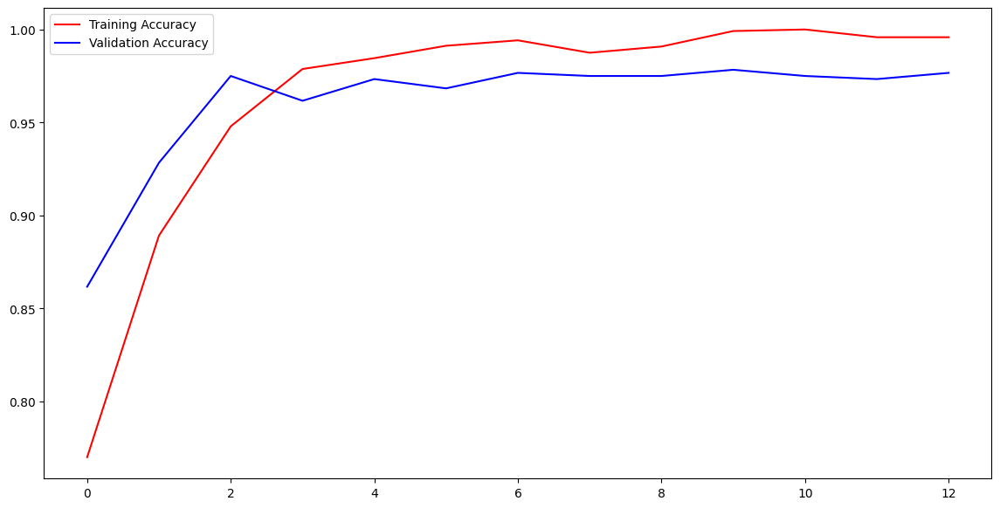

In [51]:
accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']
epochs = range(len(accuracy))
fig = plt.figure(figsize=(14,7))
plt.plot(epochs,accuracy,'r',label="Training Accuracy")
plt.plot(epochs,validation_accuracy,'b',label="Validation Accuracy")
plt.legend(loc='upper left')
plt.show()

#### VGG16

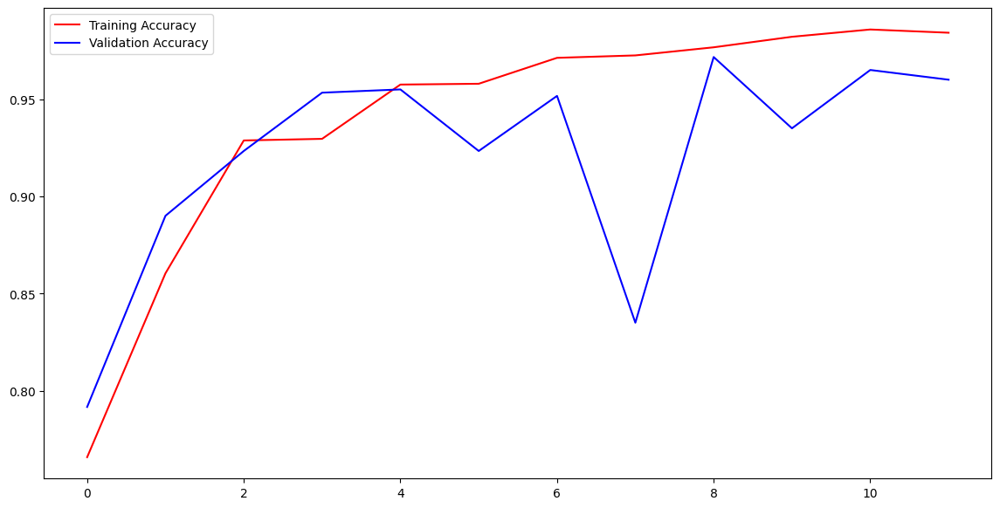

In [52]:
accuracy = history_vgg16_modified.history['accuracy']
validation_accuracy = history_vgg16_modified.history['val_accuracy']
epochs = range(len(accuracy))
fig = plt.figure(figsize=(14,7))
plt.plot(epochs,accuracy,'r',label="Training Accuracy")
plt.plot(epochs,validation_accuracy,'b',label="Validation Accuracy")
plt.legend(loc='upper left')
plt.show()

#### InceptionV3

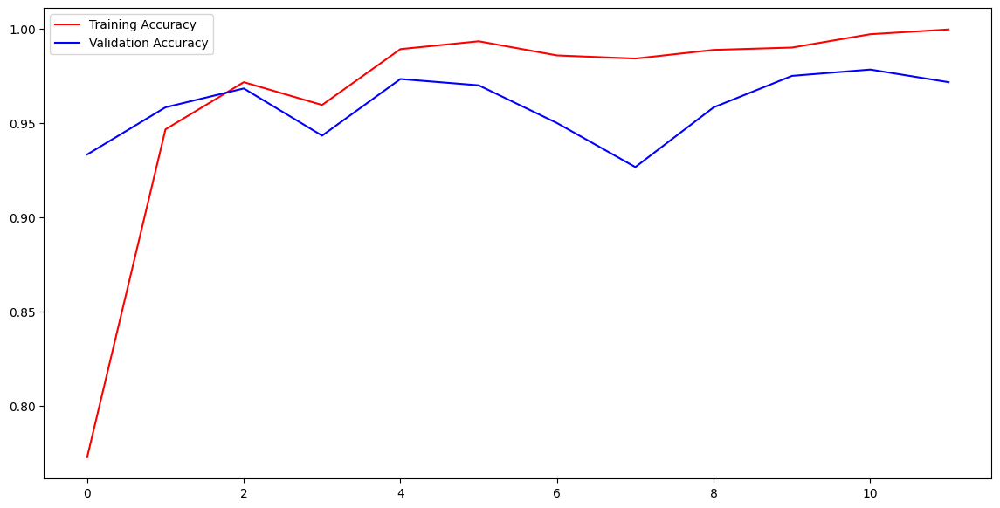

In [53]:
accuracy = history_inception_v3_modified.history['accuracy']
validation_accuracy = history_inception_v3_modified.history['val_accuracy']
epochs = range(len(accuracy))
fig = plt.figure(figsize=(14,7))
plt.plot(epochs,accuracy,'r',label="Training Accuracy")
plt.plot(epochs,validation_accuracy,'b',label="Validation Accuracy")
plt.legend(loc='upper left')
plt.show()

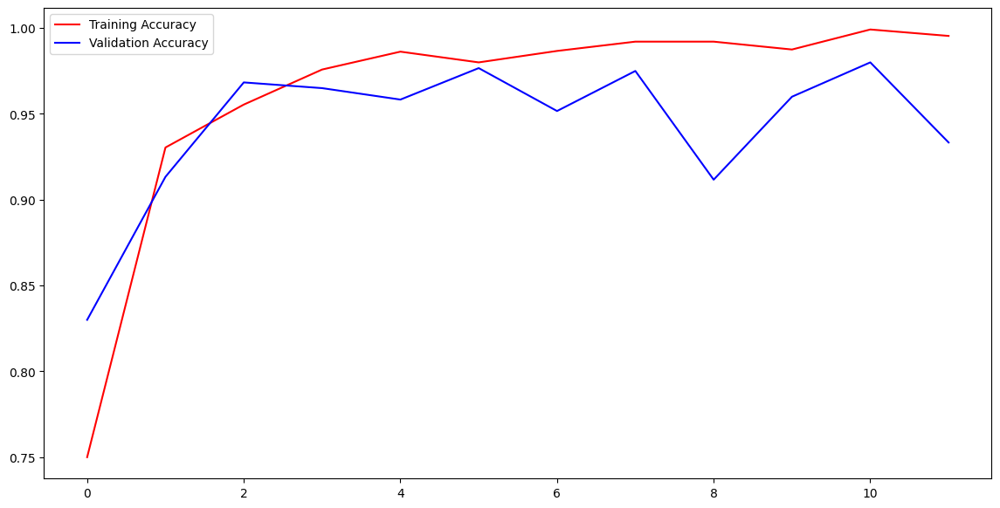

In [54]:
accuracy = history_xception_modified.history['accuracy']
validation_accuracy = history_xception_modified.history['val_accuracy']
epochs = range(len(accuracy))
fig = plt.figure(figsize=(14,7))
plt.plot(epochs,accuracy,'r',label="Training Accuracy")
plt.plot(epochs,validation_accuracy,'b',label="Validation Accuracy")
plt.legend(loc='upper left')
plt.show()

## Traning loss and validation Loss

#### CNN Model

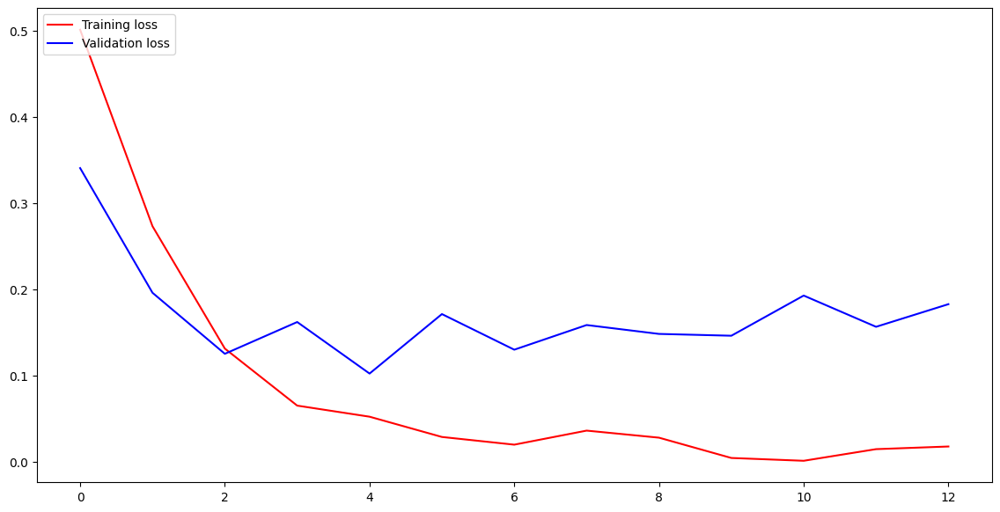

In [55]:
loss = history.history['loss']
validation_loss = history.history['val_loss']
epochs = range(len(loss))
fig = plt.figure(figsize=(14,7))
plt.plot(epochs,loss,'r',label="Training loss")
plt.plot(epochs,validation_loss,'b',label="Validation loss")
plt.legend(loc='upper left')
plt.show()

#### VGG16 Model

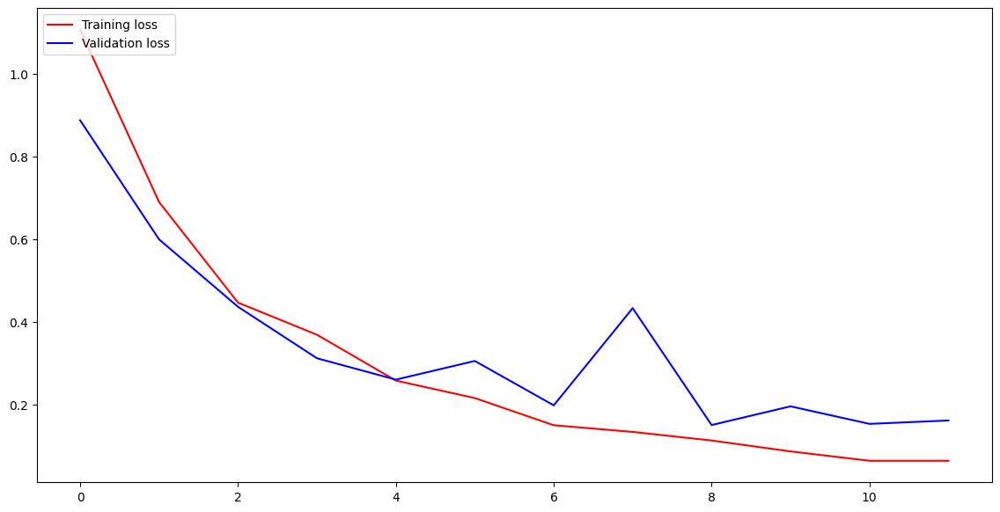

In [56]:
loss = history_vgg16_modified.history['loss']
validation_loss = history_vgg16_modified.history['val_loss']
epochs = range(len(loss))
fig = plt.figure(figsize=(14,7))
plt.plot(epochs,loss,'r',label="Training loss")
plt.plot(epochs,validation_loss,'b',label="Validation loss")
plt.legend(loc='upper left')
plt.show()

#### InceptionV3 Model

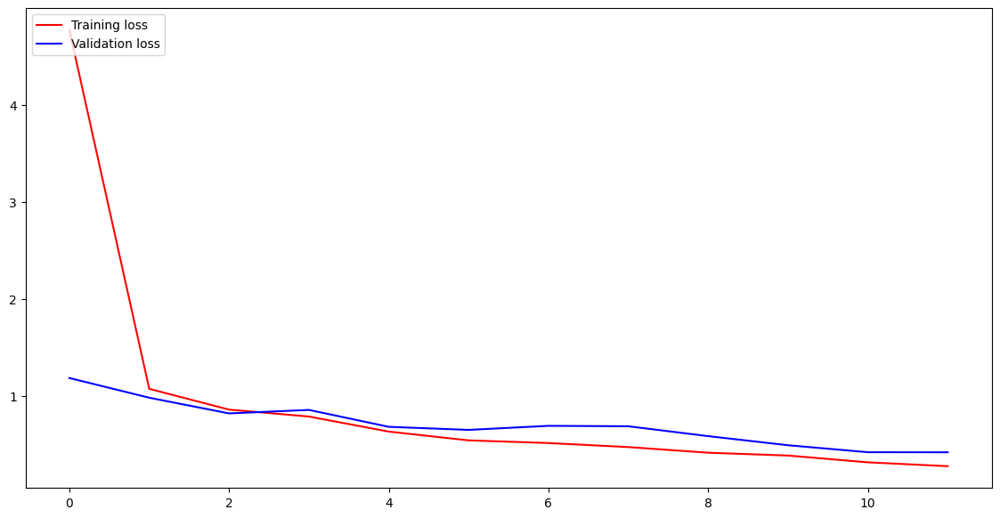

In [57]:
loss = history_inception_v3_modified.history['loss']
validation_loss = history_inception_v3_modified.history['val_loss']
epochs = range(len(loss))
fig = plt.figure(figsize=(14,7))
plt.plot(epochs,loss,'r',label="Training loss")
plt.plot(epochs,validation_loss,'b',label="Validation loss")
plt.legend(loc='upper left')
plt.show()

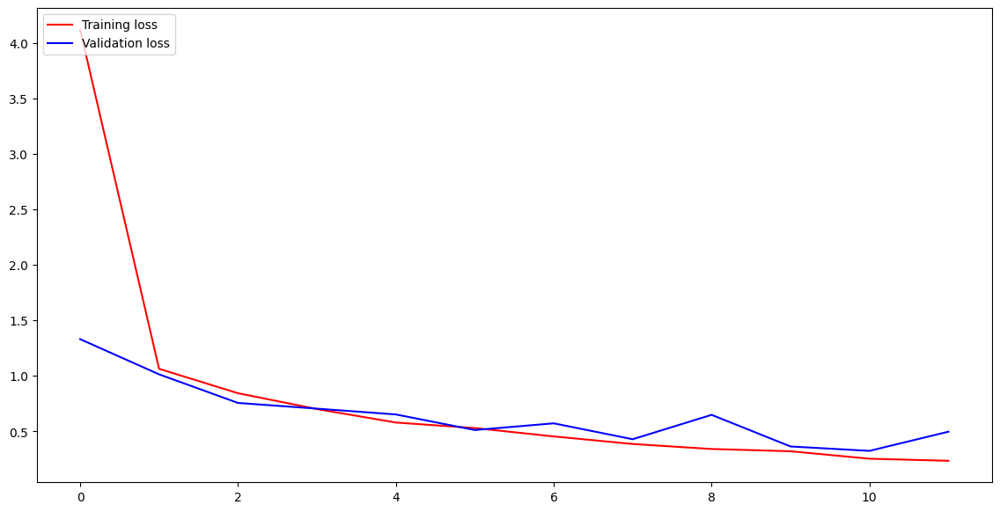

In [58]:
loss = history_xception_modified.history['loss']
validation_loss = history_xception_modified.history['val_loss']
epochs = range(len(loss))
fig = plt.figure(figsize=(14,7))
plt.plot(epochs,loss,'r',label="Training loss")
plt.plot(epochs,validation_loss,'b',label="Validation loss")
plt.legend(loc='upper left')
plt.show()

In [59]:
img = cv2.imread('../input/br35h-brain-tumor-dataset/Br35H_Brain_Tumor_Dataset/pred/pred0.jpg')
img = cv2.resize(img,(224,224))
img_array = np.array(img)
img_array.shape

(224, 224, 3)

In [60]:
img_array = img_array.reshape(1,224,224,3)
img_array.shape

(1, 224, 224, 3)

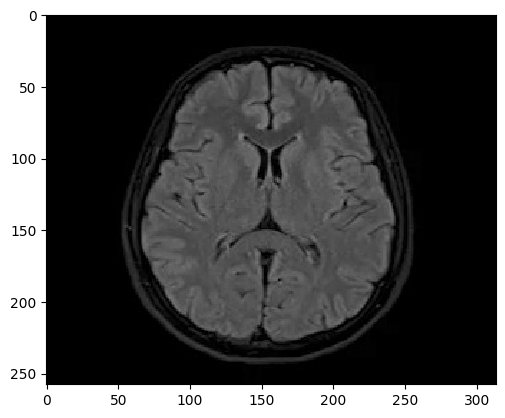

In [61]:
from tensorflow.keras.preprocessing import image
img = image.load_img('../input/br35h-brain-tumor-dataset/Br35H_Brain_Tumor_Dataset/pred/pred0.jpg')
plt.imshow(img,interpolation='nearest')
plt.show()

In [62]:
a=model_cnn.predict(img_array)
b=vgg16_modified.predict(img_array)
c=model_inception_v3_modified.predict(img_array)
d=model_xception_modified.predict(img_array)
indices_cnn = a.argmax()
indices_vgg16 = b.argmax()
indices_inceptionv3 = c.argmax()
indices_xception = d.argmax()
print('Pridicted by the CNN model is',indices_cnn)
print('Pridicted by the VGG16 model is',indices_vgg16)
print('Pridicted by the InceptionV3 model is',indices_inceptionv3)
print('Pridicted by the Xception model is',indices_xception)

1/1 [==============================] - 1s 782ms/step
Pridicted by the CNN model is 0
Pridicted by the VGG16 model is 0
Pridicted by the InceptionV3 model is 1
Pridicted by the Xception model is 1


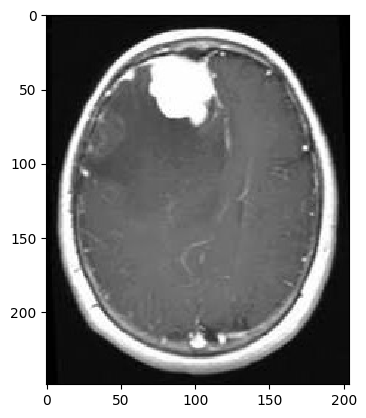

In [63]:
from tensorflow.keras.preprocessing import image
img = image.load_img('../input/br35h-brain-tumor-dataset/Br35H_Brain_Tumor_Dataset/pred/pred7.jpg')
plt.imshow(img,interpolation='nearest')
plt.show()

In [64]:
img = cv2.imread('../input/br35h-brain-tumor-dataset/Br35H_Brain_Tumor_Dataset/pred/pred7.jpg')
img = cv2.resize(img,(224,224))
img_array = np.array(img)
img_array.shape

(224, 224, 3)

In [65]:
img_array = img_array.reshape(1,224,224,3)
img_array.shape

(1, 224, 224, 3)

In [66]:
a=model_cnn.predict(img_array)
b=vgg16_modified.predict(img_array)
c=model_inception_v3_modified.predict(img_array)
d=model_xception_modified.predict(img_array)
indices_cnn = a.argmax()
indices_vgg16 = b.argmax()
indices_inceptionv3 = c.argmax()
indices_xception = d.argmax()
print('Pridicted by the CNN model is',indices_cnn)
print('Pridicted by the VGG16 model is',indices_vgg16)
print('Pridicted by the InceptionV3 model is',indices_inceptionv3)
print('Pridicted by the Xception model is',indices_xception)

1/1 [==============================] - 0s 123ms/step
Pridicted by the CNN model is 1
Pridicted by the VGG16 model is 1
Pridicted by the InceptionV3 model is 1
Pridicted by the Xception model is 1


In [67]:
pred_path=('../input/br35h-brain-tumor-dataset/Br35H_Brain_Tumor_Dataset/pred')

In [68]:
import glob as gb

X_pred = []
files = gb.glob(pathname= str(pred_path + '/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (224,224))
    X_pred.append(list(image_array))     
print(f'we have {len(X_pred)} items') 

we have 60 items


In [69]:
X_pred = np.array(X_pred)
X_pred.shape

(60, 224, 224, 3)

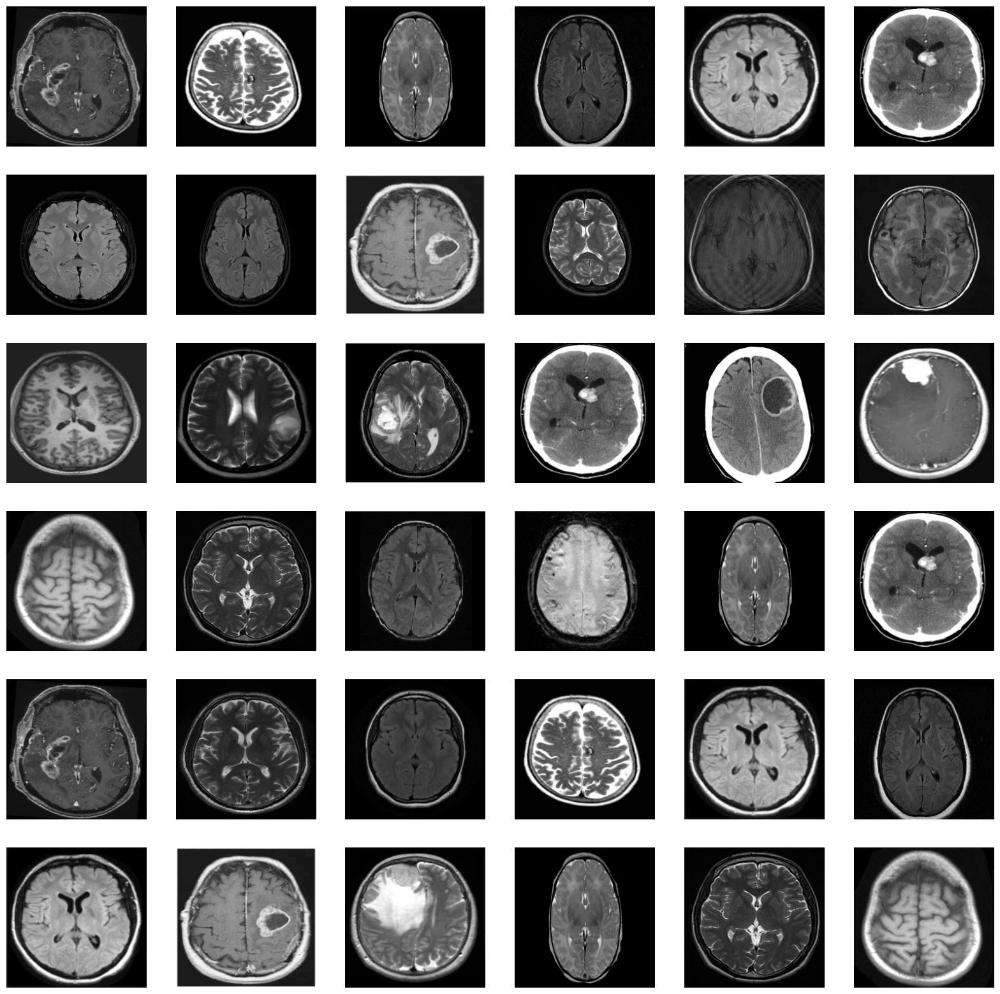

In [70]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')

In [71]:
Y_pred_cnn = model_cnn.predict(X_pred)

print('Prediction Shape is {}'.format(Y_pred_cnn.shape))

2/2 [==============================] - 0s 64ms/step
Prediction Shape is (60, 2)


In [72]:
code = {'No Tumor ':0 ,'Tumor':1}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x    

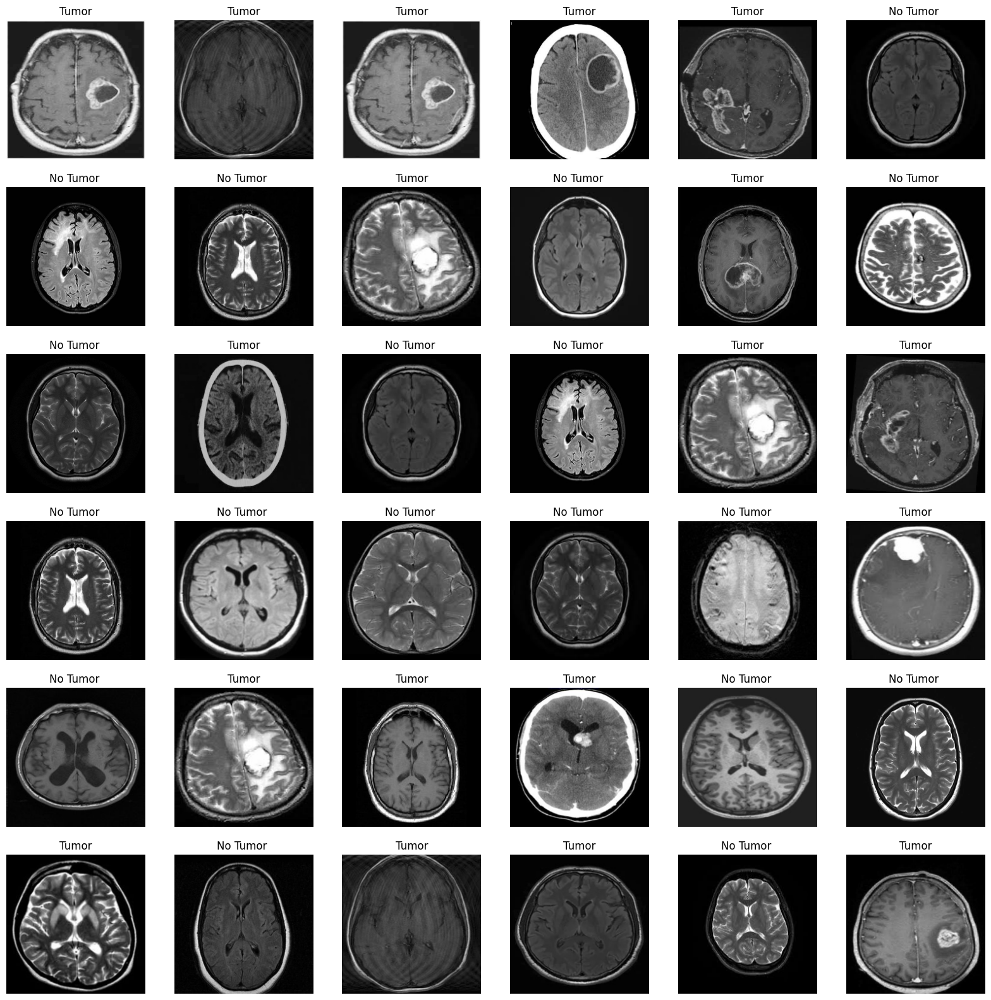

In [73]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(Y_pred_cnn[i])))

In [74]:
Y_pred_vgg16 = vgg16_modified.predict(X_pred)

print('Prediction Shape is {}'.format(Y_pred_vgg16.shape))

2/2 [==============================] - 1s 576ms/step
Prediction Shape is (60, 2)


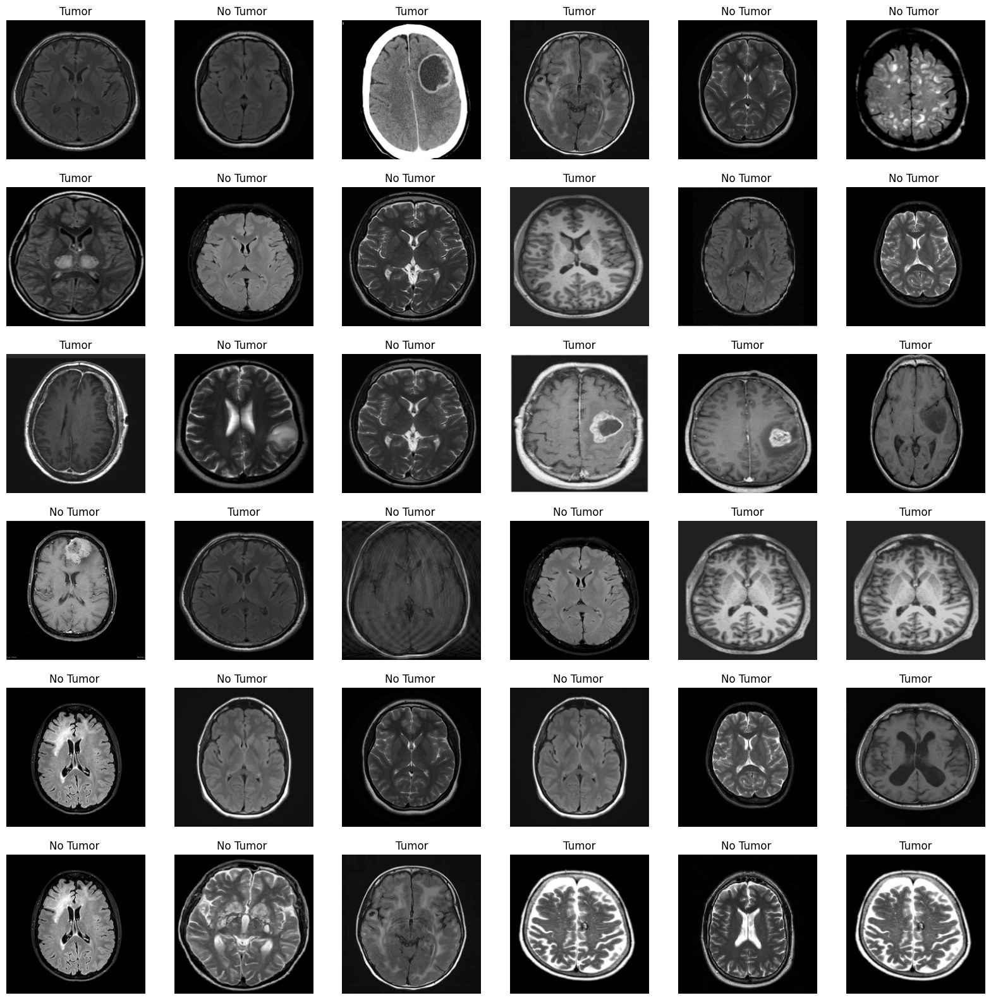

In [75]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(Y_pred_vgg16[i])))

In [76]:
Y_pred_inceptionv3 = model_inception_v3_modified.predict(X_pred)

print('Prediction Shape is {}'.format(Y_pred_inceptionv3.shape))

2/2 [==============================] - 0s 195ms/step
Prediction Shape is (60, 2)


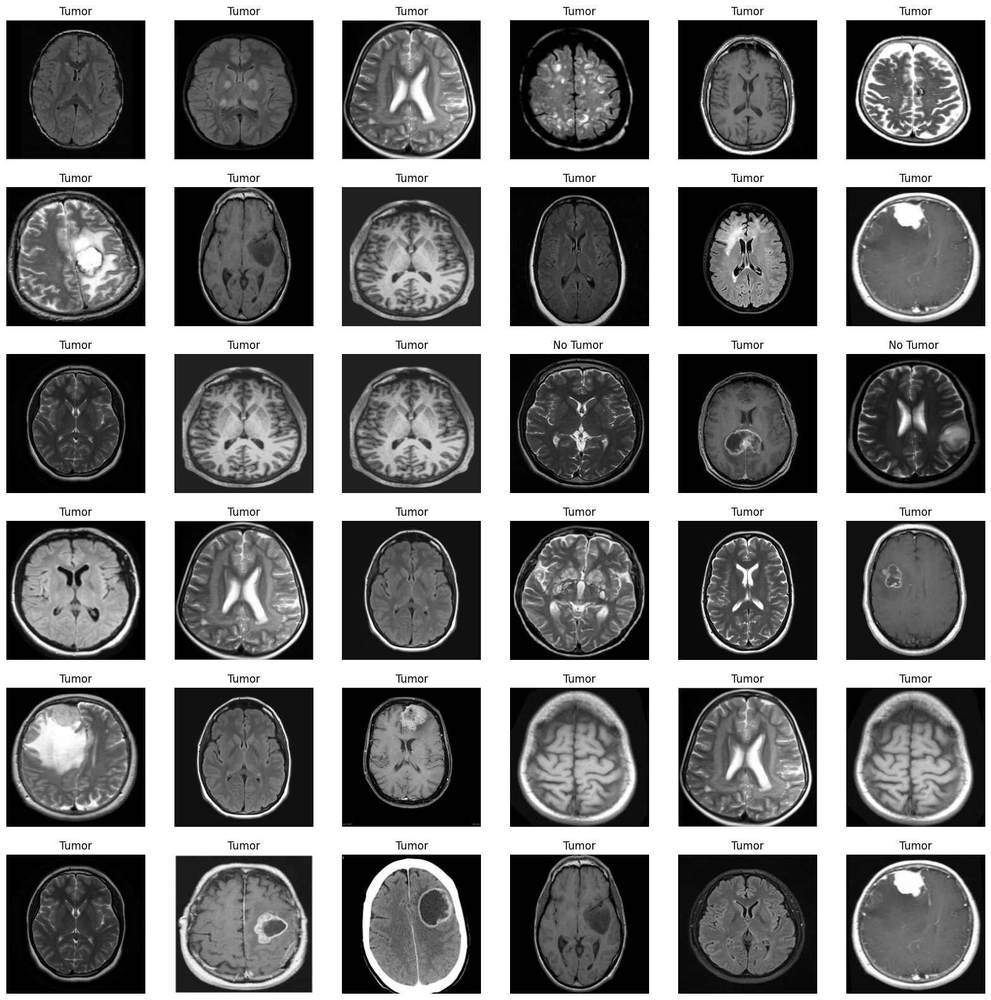

In [77]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(Y_pred_inceptionv3[i])))

In [78]:
Y_pred_xception = model_xception_modified.predict(X_pred)

print('Prediction Shape is {}'.format(Y_pred_xception.shape))

2/2 [==============================] - 1s 436ms/step
Prediction Shape is (60, 2)


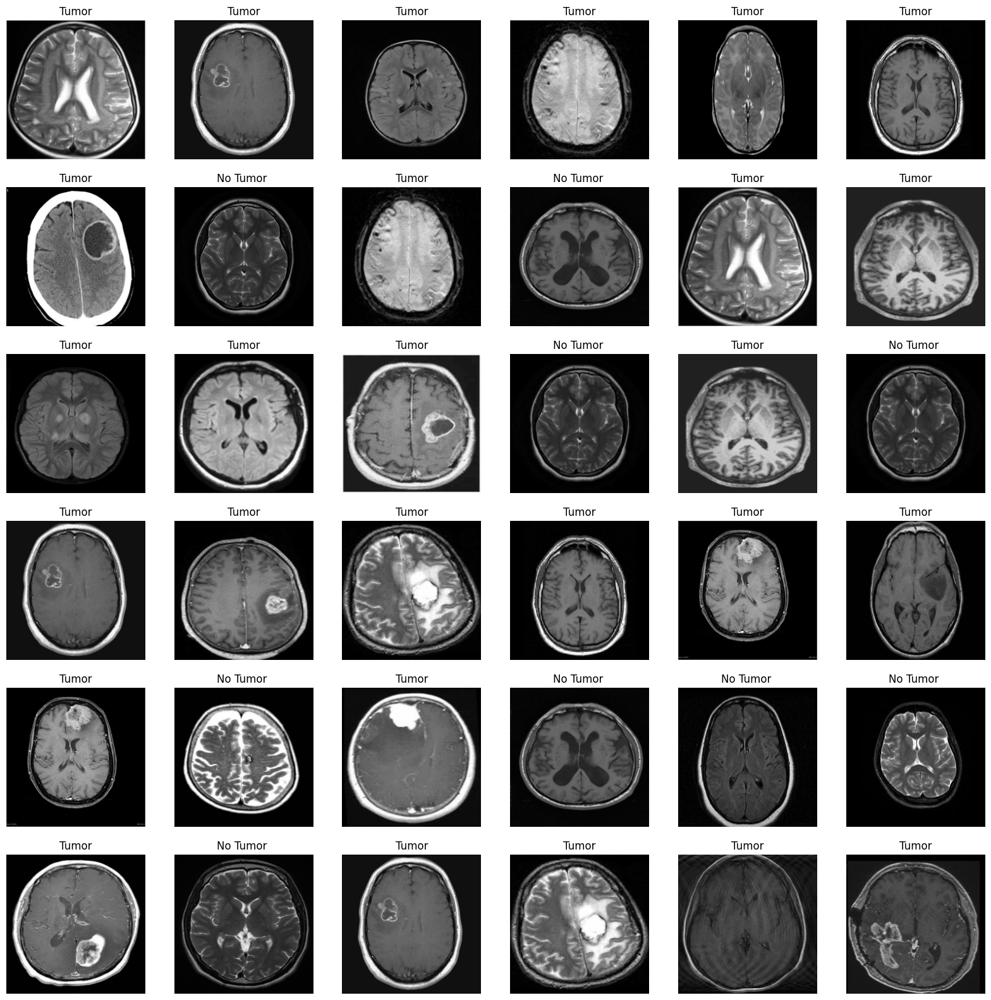

In [79]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(Y_pred_xception[i])))

19/19 [==============================] - 10s 507ms/step


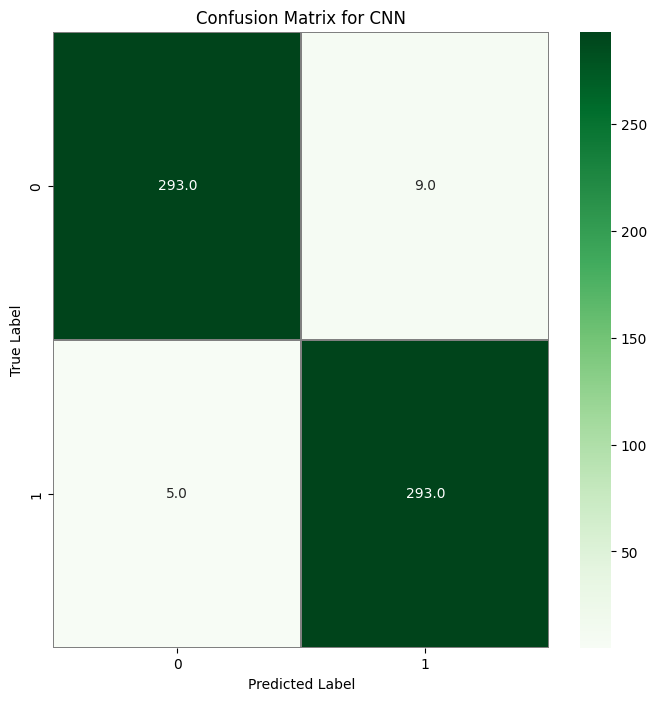

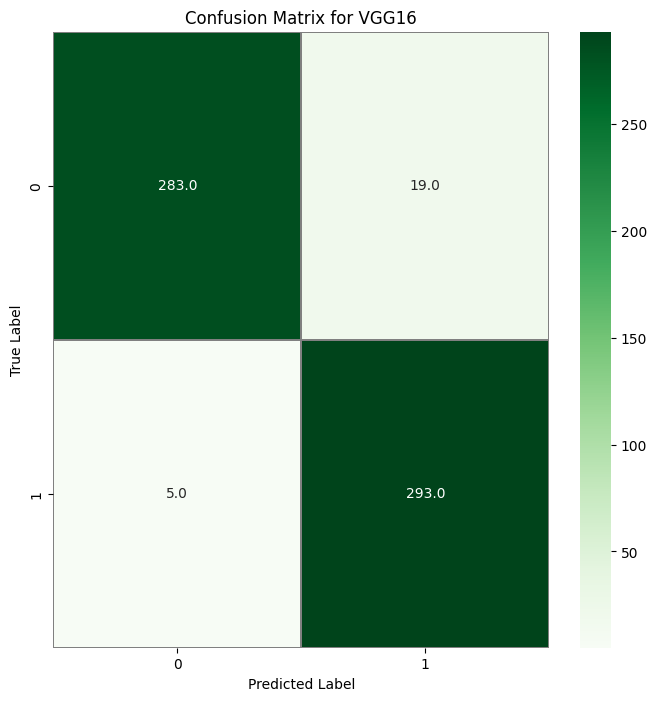

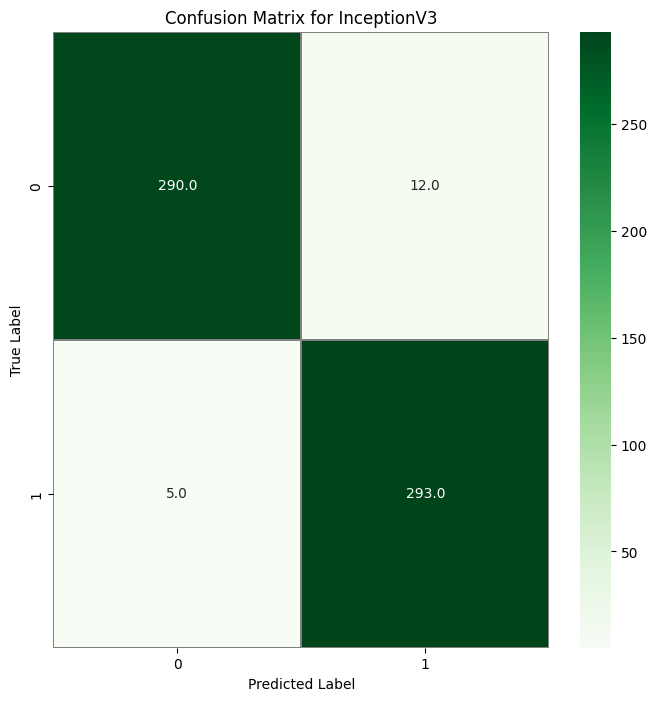

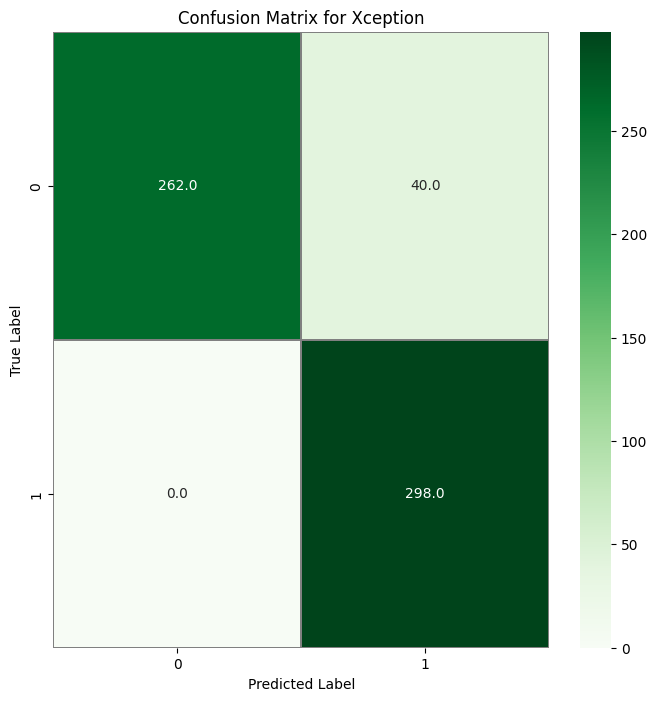

In [80]:
# confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Predict the values from the validation dataset
Y_pred_cnn = model_cnn.predict(X_test)
Y_pred_vgg16 = vgg16_modified.predict(X_test)
Y_pred_inceptionv3 = model_inception_v3_modified.predict(X_test)
Y_pred_xception = model_xception_modified.predict(X_test)


# Convert predictions classes to one hot vectors 
Y_pred_cnn_classes = np.argmax(Y_pred_cnn,axis = 1) 
Y_pred_vgg16_classes = np.argmax(Y_pred_vgg16,axis = 1) 
Y_pred_inceptionv3_classes = np.argmax(Y_pred_inceptionv3,axis = 1) 
Y_pred_xception_classes = np.argmax(Y_pred_xception,axis = 1) 

# Convert validation observations to one hot vectors
Y_true = np.argmax(Y_test,axis = 1) 

# compute the confusion matrix
confusion_mtx_cnn = confusion_matrix(Y_true, Y_pred_cnn_classes) 
confusion_mtx_vgg16 = confusion_matrix(Y_true, Y_pred_vgg16_classes) 
confusion_mtx_inceptionv3 = confusion_matrix(Y_true, Y_pred_inceptionv3_classes) 
confusion_mtx_xception = confusion_matrix(Y_true, Y_pred_xception_classes) 

# plot the confusion matrix for CNN model
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx_cnn, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for CNN")
plt.show()

# plot the confusion matrix for VGG16 model
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx_vgg16, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for VGG16")
plt.show()

# plot the confusion matrix for InceptionV3 model
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx_inceptionv3, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for InceptionV3")
plt.show()

# plot the confusion matrix for InceptionV3 model
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx_xception, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for Xception")
plt.show()

# Analysis of the Results

In [81]:

def calculate_metrics(confusion_matrix, categories):
    """
    Function to calculate important metrics for multi-classification problems.
    """
    # Calculating 4 different metrics
    precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis=0)
    recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis=1)
    f1_score = 2 * (precision * recall) / (precision + recall)
    accuracy = np.sum(np.diag(confusion_matrix)) / np.sum(confusion_matrix)

    # Printing the results based on each category
    for i, category in enumerate(categories):
        print(f"Class: {category.title()}")
        print(f"Precision: {precision[i]:.3f}")
        print(f"Recall: {recall[i]:.3f}")
        print(f"F1-Score: {f1_score[i]:.3f}\n")
        
    # Showing the total accuracy of the model
    print(f"\nAccuracy: {accuracy:.3f}")

#### Metrics for CNN

In [82]:
calculate_metrics(confusion_matrix = confusion_mtx_cnn, categories = labels)

Class: No
Precision: 0.983
Recall: 0.970
F1-Score: 0.977

Class: Yes
Precision: 0.970
Recall: 0.983
F1-Score: 0.977


Accuracy: 0.977


#### Metrics for VGG16

In [83]:
calculate_metrics(confusion_matrix = confusion_mtx_vgg16, categories = labels)

Class: No
Precision: 0.983
Recall: 0.937
F1-Score: 0.959

Class: Yes
Precision: 0.939
Recall: 0.983
F1-Score: 0.961


Accuracy: 0.960


In [84]:
calculate_metrics(confusion_matrix = confusion_mtx_inceptionv3, categories = labels)

Class: No
Precision: 0.983
Recall: 0.960
F1-Score: 0.972

Class: Yes
Precision: 0.961
Recall: 0.983
F1-Score: 0.972


Accuracy: 0.972


In [85]:
calculate_metrics(confusion_matrix = confusion_mtx_xception, categories = labels)

Class: No
Precision: 1.000
Recall: 0.868
F1-Score: 0.929

Class: Yes
Precision: 0.882
Recall: 1.000
F1-Score: 0.937


Accuracy: 0.933


### Classification Report

In [86]:
from sklearn.metrics import classification_report

print(classification_report(Y_true, Y_pred_cnn_classes))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98       302
           1       0.97      0.98      0.98       298

    accuracy                           0.98       600
   macro avg       0.98      0.98      0.98       600
weighted avg       0.98      0.98      0.98       600



In [87]:
print(classification_report(Y_true, Y_pred_vgg16_classes))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96       302
           1       0.94      0.98      0.96       298

    accuracy                           0.96       600
   macro avg       0.96      0.96      0.96       600
weighted avg       0.96      0.96      0.96       600



In [88]:
print(classification_report(Y_true, Y_pred_inceptionv3_classes))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       302
           1       0.96      0.98      0.97       298

    accuracy                           0.97       600
   macro avg       0.97      0.97      0.97       600
weighted avg       0.97      0.97      0.97       600



In [89]:
print(classification_report(Y_true, Y_pred_xception_classes))

              precision    recall  f1-score   support

           0       1.00      0.87      0.93       302
           1       0.88      1.00      0.94       298

    accuracy                           0.93       600
   macro avg       0.94      0.93      0.93       600
weighted avg       0.94      0.93      0.93       600



# Average/Sum Ensemble

In [90]:
from keras.models import load_model
from sklearn.metrics import accuracy_score
#model_path = CNN_model
model1 = load_model('CNN_model.h5')
model2 = load_model('vgg16_modified.h5')
model3 = load_model('model_inception_v3_modified.h5')
model4 = load_model('model_xception_modified.h5')

models = [model1, model2, model3, model4]

preds = [model.predict(X_test) for model in models]
preds=np.array(preds)
summed = np.sum(preds, axis=0)

# argmax across classes
ensemble_prediction = np.argmax(summed, axis=1)

prediction1 = model1.predict(X_test)
Pred_classes_1 = np.argmax(prediction1,axis=1)

prediction2 = model2.predict(X_test)
Pred_classes_2 = np.argmax(prediction2,axis=1)

prediction3 = model3.predict(X_test)
Pred_classes_3 = np.argmax(prediction3,axis=1)

prediction4 = model4.predict(X_test)
Pred_classes_4 = np.argmax(prediction4,axis=1)

accuracy1 = accuracy_score(Y_true, Pred_classes_1)
accuracy2 = accuracy_score(Y_true, Pred_classes_2)
accuracy3 = accuracy_score(Y_true, Pred_classes_3)
accuracy4 = accuracy_score(Y_true, Pred_classes_4)

print('Accuracy Score for model1 = ', accuracy1)
print('Accuracy Score for model2 = ', accuracy2)
print('Accuracy Score for model3 = ', accuracy3)
print('Accuracy Score for model4 = ', accuracy4)

ensemble_accuracy = accuracy_score(Y_true, ensemble_prediction)


print('Accuracy Score for average ensemble = ', ensemble_accuracy)

19/19 [==============================] - 9s 496ms/step
Accuracy Score for model1 =  0.9766666666666667
Accuracy Score for model2 =  0.96
Accuracy Score for model3 =  0.9716666666666667
Accuracy Score for model4 =  0.9333333333333333
Accuracy Score for average ensemble =  0.9816666666666667


# Weighted Average Ensemble

In [91]:
weights = [0.5, 0.4, 0.3, 0.2]

#Use tensordot to sum the products of all elements over specified axes.
weighted_preds = np.tensordot(preds, weights, axes=((0),(0)))
weighted_ensemble_prediction = np.argmax(weighted_preds, axis=1)

weighted_accuracy = accuracy_score(Y_true, weighted_ensemble_prediction)

In [92]:
print('Accuracy Score for model1 = ', accuracy1)
print('Accuracy Score for model2 = ', accuracy2)
print('Accuracy Score for model3 = ', accuracy3)
print('Accuracy Score for model4 = ', accuracy4)
print('Accuracy Score for average ensemble = ', ensemble_accuracy*100)
print('Accuracy Score for weighted average ensemble = ', weighted_accuracy*100)

Accuracy Score for model1 =  0.9766666666666667
Accuracy Score for model2 =  0.96
Accuracy Score for model3 =  0.9716666666666667
Accuracy Score for model4 =  0.9333333333333333
Accuracy Score for average ensemble =  98.16666666666667
Accuracy Score for weighted average ensemble =  98.16666666666667


# Grid search for the best combination of w1, w2, w3 that gives maximum acuracy

In [93]:
models = [model1, model2, model3, model4]
preds1 = [model.predict(X_test) for model in models]
preds1=np.array(preds1)


import pandas as pd

df = pd.DataFrame([])

for w1 in range(0, 9):
    for w2 in range(0, 9):
        for w3 in range(0, 9):
            for w4 in range(0, 9):
                wts = [w1/10., w2/10., w3/10. ,w4/10.]
                wted_preds1 = np.tensordot(preds1, wts, axes=((0),(0)))
                wted_ensemble_pred = np.argmax(wted_preds1, axis=1)
                weighted_accuracy = accuracy_score(Y_true, wted_ensemble_pred)
                df = pd.concat([df, pd.DataFrame.from_records([{'wt1':wts[0], 'wt2':wts[1], 'wt3':wts[2], 'wt4':wts[3],
                             'acc':weighted_accuracy*100}],index=[0])], ignore_index=True)


max_acc_row = df.iloc[df['acc'].idxmax()]
print("Max accuracy of ", max_acc_row[4], 
      "obained with w1 = ", max_acc_row[0],
      ", w2 = ", max_acc_row[1], 
      ", w3 = ", max_acc_row[2], "and w4 = ", max_acc_row[3])         

19/19 [==============================] - 10s 498ms/step
Max accuracy of  98.66666666666667 obained with w1 =  0.1 , w2 =  0.1 , w3 =  0.2 and w4 =  0.2


# Explore metrics for the ideal weighted ensemble model

19/19 [==============================] - 9s 491ms/step
Predicted Label:  yes
True Label:  yes


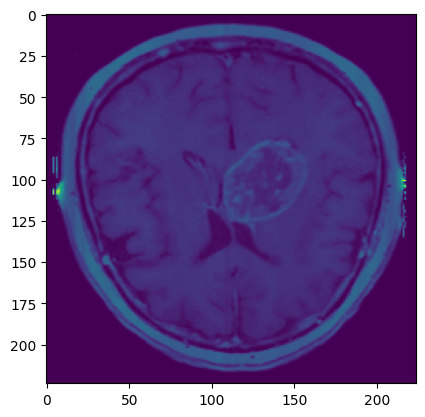

In [94]:
import random

models = [model1, model2, model3, model4]
preds = [model.predict(X_test) for model in models]
preds=np.array(preds)

ideal_weights = [0.1, 0.1, 0.2, 0.2] # Ideal weights

# Use tensordot to sum the products of all elements over specified axes.
ideal_weighted_preds = np.tensordot(preds, ideal_weights, axes=((0),(0)))
ideal_weighted_ensemble_prediction = np.argmax(ideal_weighted_preds, axis=1)

ideal_weighted_accuracy = accuracy_score(Y_true, ideal_weighted_ensemble_prediction)



i = random.randint(1,len(ideal_weighted_ensemble_prediction))
plt.imshow(X_test[i,:,:,0]) 
print("Predicted Label: ", labels[int(ideal_weighted_ensemble_prediction[i])])
print("True Label: ", labels[int(Y_true[i])])

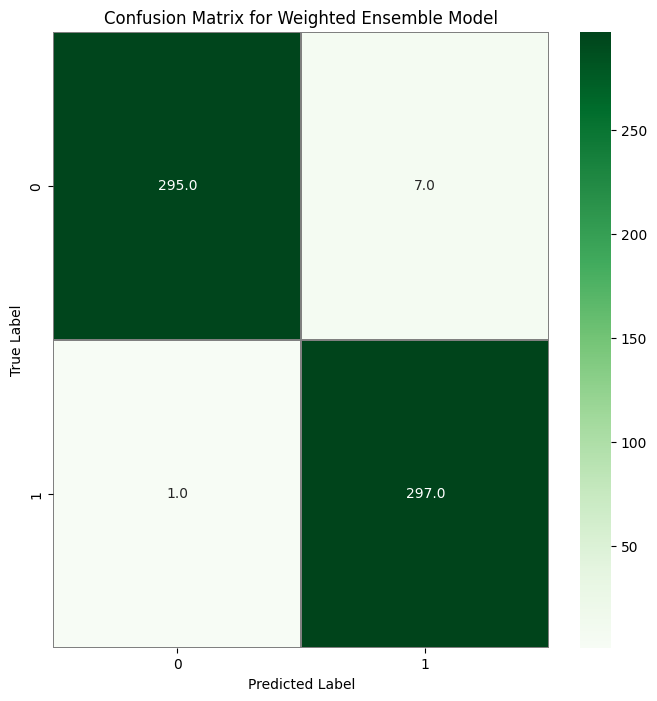

In [95]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

#Print confusion matrix
cm = confusion_matrix(Y_true, ideal_weighted_ensemble_prediction)

# plot the confusion matrix for CNN model
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(cm, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for Weighted Ensemble Model")
plt.show()

([<matplotlib.axis.XTick at 0x7b8117ba46a0>,
 [Text(0, 0, 'no'), Text(1, 0, 'yes')])

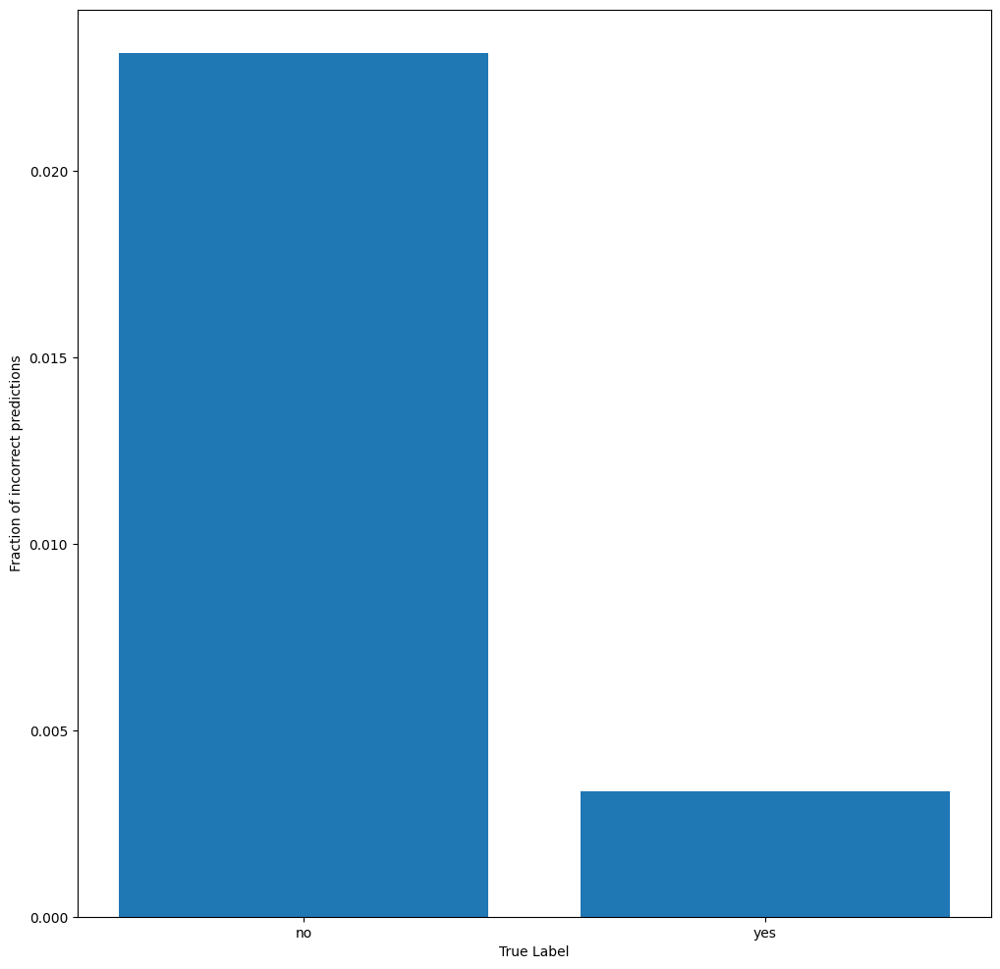

In [96]:
#PLot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)

fig, ax = plt.subplots(figsize=(12,12))
plt.bar(np.arange(2), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')
plt.xticks(np.arange(2), labels) 